# 6. EXTRACTING FRAMES FROM VIDEOS AND ANALYSING FRAMES

In [ ]:
import cv2
import matplotlib.pyplot as plt
import os 
import numpy as np
from moviepy.editor import *
from moviepy.editor import VideoFileClip
import warnings
warnings.filterwarnings("ignore")

Imageio: 'ffmpeg-linux64-v3.3.1' was not found on your computer; downloading it now.
Try 1. Download from https://github.com/imageio/imageio-binaries/raw/master/ffmpeg/ffmpeg-linux64-v3.3.1 (43.8 MB)
Downloading: 8192/45929032 bytes (0.0%)3497984/45929032 bytes (7.6%)7061504/45929032 bytes (15.4%)10641408/45929032 bytes (23.2%)13746176/45929032 bytes (29.9%)17293312/45929032 bytes (37.7%)20979712/45929032 bytes (45.7%)24649728/45929032 bytes (53.7%)28311552/45929032 bytes (61.6%)32030720/45929032 bytes (69.7%)35676160/45929032 bytes (77.7%)39223296/45929032 bytes (85.4%)42909696/45929032 bytes (93.4%)

In [ ]:
pip install imageio==2.4.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install moviepy=1.0.3

ERROR: Invalid requirement: 'moviepy=1.0.3'
Hint: = is not a valid operator. Did you mean == ?


Total number of frames: 265


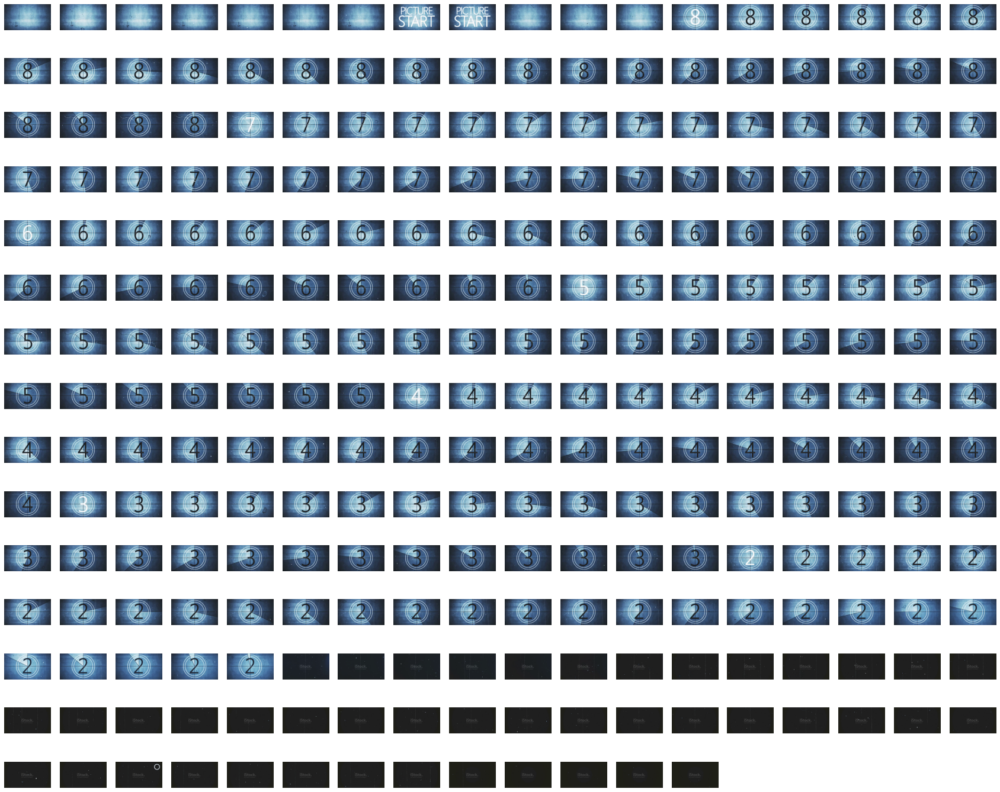

In [ ]:
def frame():
  video_path = '/content/video.com.mp4'
  cap = cv2.VideoCapture(video_path)
  total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
  print("Total number of frames:",total_frames)
  plt.figure(figsize=(30,30))
  for i in range(total_frames):
      ret, frame = cap.read() #extracting the frames from the video
      plt.subplot(18,18,i+1)
      plt.imshow(cv2.cvtColor(frame,cv2.COLOR_BGR2RGB))
      plt.axis("off")
  plt.show() 
frame()  

In [ ]:
video = cv2.VideoCapture("/content/video.com.mp4")
fps = video.get(cv2.CAP_PROP_FPS)
print("Frame per second ::::::::::::::::",fps)
frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
print("Frame width :::::::::::::::::",frame_width)
frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
total_frames = int(video.get(cv2.CAP_PROP_FRAME_COUNT))
print("Total number of frames::::::::",total_frames)
print("Frame height :::::::::::::::::",frame_height)
video_clip = VideoFileClip("/content/video.com.mp4")
video_clip.ipython_display()

Frame per second :::::::::::::::: 30.0
Frame width ::::::::::::::::: 640
Total number of frames:::::::: 265
Frame height ::::::::::::::::: 360


100%|██████████| 266/266 [00:01<00:00, 181.58it/s]


In [ ]:
def slow_motion(input_file):
  video = cv2.VideoCapture(input_file)
  fps = video.get(cv2.CAP_PROP_FPS)
  print("The frames per second:",fps)
  frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
  print("Frame width :",frame_width)
  frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
  print("Frame height :",frame_height)
  fourcc = cv2.VideoWriter_fourcc(*'mp4v')
  out = cv2.VideoWriter('output_slowmotion.mp4', fourcc, 20, (frame_width, frame_height))
  while True:
      ret, frame = video.read()
      if not ret:       #60 -- 4s
          break
      for i in range(1):
          out.write(frame)
  video.release()
  out.release()
  video_clip = VideoFileClip("output_slowmotion.mp4")
  return video_clip.ipython_display()
  
slow_motion("/content/video.com.mp4")  

The frames per second: 30.0
Frame width : 640
Frame height : 360


100%|█████████▉| 265/266 [00:02<00:00, 96.67it/s] 


In [ ]:
def fast_motion(input_file):
    video = cv2.VideoCapture(input_file)
    fps = video.get(cv2.CAP_PROP_FPS)
    print("The frames per second:",fps)
    frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    print("Frame width :",frame_width)
    frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    print("Frame height :",frame_height)
    fourcc = cv2.VideoWriter_fourcc(*'mp4v')
    out = cv2.VideoWriter('output_fast_motion.mp4', fourcc,80, (frame_width, frame_height))
    while True:
        ret, frame = video.read()
        if not ret:
            break
        out.write(frame)
    video.release()
    out.release()

    video_clip = VideoFileClip("output_fast_motion.mp4")
    return video_clip.ipython_display()
fast_motion("/content/video.com.mp4")

The frames per second: 30.0
Frame width : 640
Frame height : 360


100%|██████████| 265/265 [00:01<00:00, 231.14it/s]


In [ ]:
def grayscale_video(video_path):
    video = cv2.VideoCapture(video_path)
    fps = video.get(cv2.CAP_PROP_FPS)
    print("The frames per second:",fps)
    frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    print("Frame width :",frame_width)
    frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    print("Frame height :",frame_height)
    out = cv2.VideoWriter('grayscale_video.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (int(video.get(cv2.CAP_PROP_FRAME_WIDTH)), int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))), isColor=False)
    while video.isOpened():
        ret, frame = video.read()
        if ret:
            gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
            out.write(gray)
        else:
            break
    video.release()
    out.release()
    video_clip = VideoFileClip("grayscale_video.mp4")
    return video_clip.ipython_display()
grayscale_video("/content/video.com.mp4")

The frames per second: 30.0
Frame width : 640
Frame height : 360


100%|██████████| 265/265 [00:01<00:00, 237.56it/s]


In [ ]:
def interchanged_video(video_path):
    video = cv2.VideoCapture(video_path)
    fps = video.get(cv2.CAP_PROP_FPS)
    print("The frames per second:",fps)
    frame_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
    print("Frame width :",frame_width)
    frame_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
    print("Frame height :",frame_height)
    interchanged_frames = []
    while video.isOpened():
        ret, frame = video.read()
        if ret:
            interchanged_frames.insert(0, frame)
        else:
            break
    video.release()
    out = cv2.VideoWriter('interchanged_video.mp4', cv2.VideoWriter_fourcc(*'mp4v'), fps, (frame_width,frame_height))
    for frame in interchanged_frames:
        out.write(frame)
    out.release()
    video_clip = VideoFileClip("interchanged_video.mp4")
    return video_clip.ipython_display()
interchanged_video("/content/video.com.mp4")

The frames per second: 30.0
Frame width : 640
Frame height : 360


100%|██████████| 265/265 [00:01<00:00, 180.85it/s]
